# Training on nm-01, nm-02, nm-03, nm-04


In [0]:
from google.colab import drive 
drive.mount('/content/gdrive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/gdrive


In [0]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import matplotlib
from tqdm import tqdm

In [0]:
DATA_PATH='/content/gdrive/My Drive/one_gait_cycle'
subjects = os.listdir(DATA_PATH)
subjects.sort()
SUB_PATH = [ os.path.join(DATA_PATH,subject) for subject in subjects]
SUB_PATH[0].split('/')[-1]

'001'

In [0]:
#sub_images = []

for path in tqdm(SUB_PATH):
  a = os.listdir(path)
  a.sort()
  a = a[0:2]
  c = 1
  for i in a:
    
    sill_img_path = os.path.join(path,i)
    sill_images = os.listdir(sill_img_path)
    sill_images.sort()
    
    k = len(sill_images) // 20
    
    # for j in range(k):
    
    _ = [] 
    for img in sill_images:
      
      img_path = os.path.join(sill_img_path,img)
      img = cv2.imread(img_path)
      img = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
      img = cv2.resize(img, (256,256))
      ret , img = cv2.threshold(img,127,1,cv2.THRESH_BINARY)
      _.append(img)



      # c+=1
      # if c % 20 == 0:
      #   break
        
        
    #sub_images.append(_)

    if os.path.exists('/content/gdrive/My Drive/Casia_BGEI_1gait') == 0:
      os.mkdir('/content/gdrive/My Drive/Casia_BGEI_1gait')

    if os.path.exists('/content/gdrive/My Drive/Casia_BGEI_1gait/{}'.format(path.split('/')[-1])) == 0:
      os.mkdir('/content/gdrive/My Drive/Casia_BGEI_1gait/{}'.format(path.split('/')[-1]))
    matplotlib.image.imsave('/content/gdrive/My Drive/Casia_BGEI_1gait/{}/{}.png'.format(path.split('/')[-1],c), np.mean(_,axis=0), cmap = 'gray')
    
    c+=1

100%|██████████| 106/106 [00:23<00:00,  4.40it/s]


In [0]:
print(len(sub_images))

1056


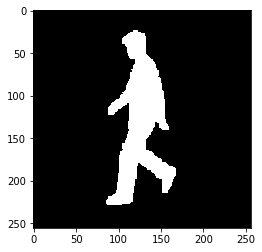

In [0]:
plt.imshow(sub_images[500][1],cmap = 'gray')

In [0]:
import os
import numpy as np 
import matplotlib.pyplot as plt
import cv2
from tqdm import tqdm
from keras.models import load_model
from keras.layers import Conv2D, Reshape
from keras.optimizers import SGD
from keras.models import Model, load_model
from keras.layers.convolutional import Conv3D
from keras.layers.convolutional_recurrent import ConvLSTM2D
from keras.layers.normalization import BatchNormalization
from keras.layers import Conv2D, Flatten , Dense
from keras.optimizers import Adam 
from keras.layers import Input
import tensorflow as tf

Using TensorFlow backend.


In [0]:
def dice_coef(y_true, y_pred, smooth=1):
    """
    Dice = (2*|X & Y|)/ (|X|+ |Y|)
         =  2*sum(|A*B|)/(sum(A^2)+sum(B^2))
    ref: https://arxiv.org/pdf/1606.04797v1.pdf
    """
    intersection = tf.reduce_sum(tf.abs(y_true * y_pred), axis=-1)
    return (2. * intersection + smooth) / (tf.reduce_sum(tf.square(y_true),-1) + tf.reduce_sum(tf.square(y_pred),-1) + smooth)

def dice_coef_loss(y_true, y_pred):
    return dice_coef(y_true, y_pred)

In [0]:
c = 32
from keras.layers import Lambda, Reshape, Permute, Input, add, Conv3D, GaussianNoise, concatenate, Dropout, MaxPooling2D,Conv2D
from keras.layers import ConvLSTM2D, BatchNormalization, TimeDistributed, Add, UpSampling2D
from keras.models import Model
from keras.layers.advanced_activations import LeakyReLU

import tensorflow as tf 

def predictor_model():
  z = Input(shape=(None,256,256,1))
  noise = GaussianNoise(0.1)(z)
  x =(ConvLSTM2D(filters=c, kernel_size=(3,3), activation = 'tanh',padding='same',name='conv_lstm1', return_sequences=True))(noise)
  c1=(BatchNormalization())(x)
  x = Dropout(0.2)(x)
  x =(TimeDistributed(MaxPooling2D(pool_size=(2,2))))(c1)
  x =(ConvLSTM2D(filters=2*c,kernel_size=(3,3), activation = 'tanh', padding='same',name='conv_lstm3',return_sequences=True))(x)
  
  c2=(BatchNormalization())(x)
  x = Dropout(0.2)(x)

  x =(TimeDistributed(MaxPooling2D(pool_size=(2,2))))(c2)
  
  x =(ConvLSTM2D(filters=4*c,kernel_size=(3,3), activation = 'tanh', padding='same',name='conv_lstm4',return_sequences=True))(x)
  

  x =(TimeDistributed(UpSampling2D(size=(2, 2))))(x)
  x =(ConvLSTM2D(filters=4*c,kernel_size=(3,3), activation='tanh', padding='same',name='conv_lstm5',return_sequences=True))(x)
  
  x =(BatchNormalization())(x)
  
  x =(ConvLSTM2D(filters=2*c,kernel_size=(3,3), activation='tanh', padding='same',  name='conv_lstm6',return_sequences=True))(x)
  
  x =(BatchNormalization())(x)
  x = Add()([c2, x])
  x = Dropout(0.2)(x)

  x =(TimeDistributed(UpSampling2D(size=(2, 2))))(x)
  
  x =(ConvLSTM2D(filters=c,kernel_size=(3,3), activation='tanh', padding='same',name='conv_lstm7',return_sequences=False))(x)
  x =(BatchNormalization())(x)
  
  print(x.shape)
  output = Conv2D(1, (3,3), padding = 'same', activation = 'sigmoid')(x)
  return Model(inputs = z , outputs = [output,output])

In [0]:
predictor = predictor_model()
#opt = Adam(lr = 0.001)
predictor.compile(loss = ['binary_crossentropy',dice_coef_loss] , loss_weights = [1,-1] ,optimizer = 'rmsprop')

(?, 256, 256, 32)


In [0]:
from keras.models import load_model
predictor = load_model('/content/gdrive/My Drive/pred_model_bigdata_repeatedLoop_part1.h5' , custom_objects = {'dice_coef_loss':dice_coef_loss , 'coef':dice_coef})








Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.









Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where




In [0]:
for epoch in range(63,100):
  loss = 0
  for sub in sub_images[:80]:
    
    l = len(sub)
    #print(l)
    _ = np.array(sub)
    _ = np.expand_dims(_ , axis = 0)
    _ = np.expand_dims(_ , axis = 4)
    
    idx = np.random.randint(1,l-5)
    #print("Index : {}".format(idx))
    x_train = _[:,:idx]
    y_train = _[:,idx:idx+4]
    #y_train = np.squeeze(y_train , axis = 0)
    #loss += sum(predictor.train_on_batch(x_train,[y_train,y_train]))

    # # print(len(x_train))
    for j in range(4):
      #y_train_1 = np.squeeze(y_train[j] , axis = 1)
      y_train_1  = y_train[0][j]
      y_train_1 = np.expand_dims(y_train_1 , axis = 0)
      loss += sum(predictor.train_on_batch(x_train,[y_train_1,y_train_1]))
      _ = predictor.predict(x_train)[0]
      #_ = np.expand_dims(_ , axis = 0)
      x_train = np.expand_dims(np.vstack((np.squeeze(x_train , axis = 0),_)),axis=0)
      

  predictor.save("/content/gdrive/My Drive/pred_model_bigdata_repeatedLoop_part1.h5")
  #print("model saved!")
  print("Epoch : {} , Loss : {}".format(epoch,loss))
    

Epoch : 58 , Loss : 34.61850961484015
Epoch : 59 , Loss : 33.09767774119973
Epoch : 60 , Loss : 33.33271121606231
Epoch : 61 , Loss : 34.00345979630947
Epoch : 62 , Loss : 33.50517985224724


KeyboardInterrupt: ignored

In [0]:
x = sub_images[75]
x = np.array(x)
x.shape

(20, 256, 256)

In [0]:
x_test = x[:9]
x_test = np.expand_dims(x_test , axis = 3)

x_test1 = x[:9]
x_test1 = np.expand_dims(x_test1 , axis = 3)

x_test.shape

(9, 256, 256, 1)

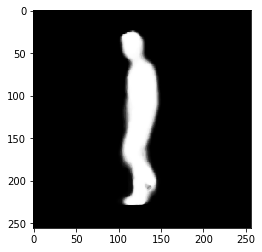

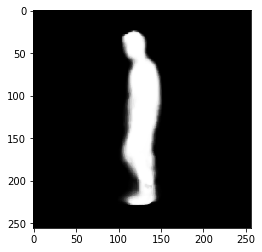

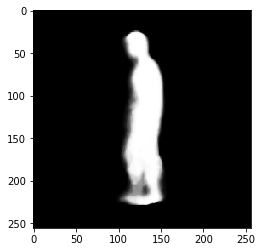

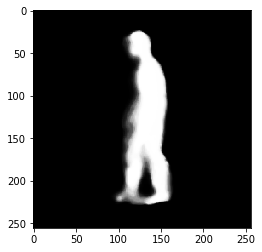

In [0]:
for i in range(4):
  pred1 = predictor.predict(np.expand_dims(x_test , axis = 0))[0]
  plt.figure()
  plt.imshow(np.squeeze(pred1), cmap = 'gray')
  x_test = np.vstack((x_test,pred1))

  # pred2 = predictor1.predict(np.expand_dims(x_test1 , axis = 0))[0]
  # plt.figure()
  # plt.imshow(np.squeeze(pred), cmap = 'gray')
  # x_test1 = np.vstack((x_test1,pred2))

  #x_test = np.vstack((x_test, np.expand_dims(x[9:14], axis = 3)))

In [0]:
x[9:14].shape

(5, 256, 256)

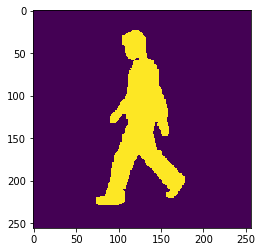

In [0]:
plt.imshow(x[9])

In [0]:
nm05 = {}

nm06 = {}

k = 0
for path in SUB_PATH:
  print(path.split('/')[-1])

  a = os.listdir(path)
  a.sort()
  nm05_img = a[0]
  nm06_img = a[1]

    
  sill_img_path = os.path.join(path,nm05_img)
  sill_images = os.listdir(sill_img_path)
  sill_images.sort()

  #print(sill_images)
  _ = []
  for img in sill_images:
    img_path = os.path.join(sill_img_path,img)
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
    img = cv2.resize(img,(256,256))
    ret,img = cv2.threshold(img,127,1,cv2.THRESH_BINARY)
    _.append(img)

  nm05[path.split('/')[-1]] = _
  k+=1

  if k == 20:
    break


  # sill_img_path = os.path.join(path,nm06_img)
  # sill_images = os.listdir(sill_img_path)
  # sill_images.sort()

  # #print(sill_images)
  # _ = []
  # for img in sill_images:
  #   img_path = os.path.join(sill_img_path,img)
  #   img = cv2.imread(img_path)
  #   img = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
  #   img = cv2.resize(img,(256,256))
  #   ret,img = cv2.threshold(img,127,1,cv2.THRESH_BINARY)
  #   _.append(img)

  # nm06[path.split('/')[-1]] = _


001
002
003
004
006
007
008
009
010
011
012
013
014
015
016
017
018
019
020
021


In [0]:
x = nm05['002']
x = np.array(x)
x1 = x[:6]
y = x[6:10]
x2 = x[:10]
x3 = x[:10]
x1 = np.expand_dims(x1, axis=3)

print(x1.shape)
print(x2.shape)
print(y.shape)


(6, 256, 256, 1)
(10, 256, 256)
(4, 256, 256)


(256, 256)
(256, 256)
(256, 256)
(256, 256)


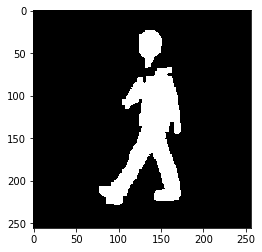

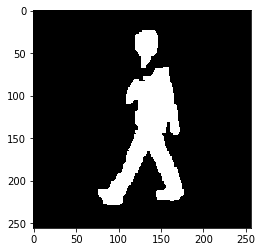

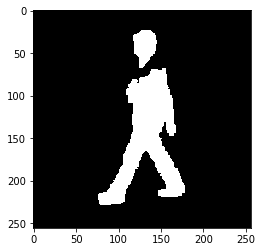

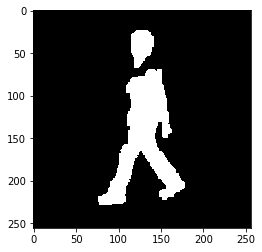

In [0]:
for i in range(6,10):
  p = np.random.randint(50,180)
  q = np.random.randint(50,180)
  x3[i] = x3
  x3[i] = np.resize(x3[i], (256,256))
  plt.figure()
  plt.imshow(x3[i],cmap='gray')

In [0]:
y_pred_comb = np.zeros((256, 256*10))
for i in range(4):
  y_pred = predictor.predict(np.expand_dims(x1,axis=0))[0]
  x1 = np.vstack((x1,y_pred))
  #print(x1[0].shape)
  #y_pred_comb[:,256*i:256*(i+1)] = np.squeeze(y_pred)
for i in range(10):
  y_pred_comb[:,256*i:256*(i+1)] = np.squeeze(x1[i])




#y_pred = np.squeeze(predictor.predict(x1)[0])

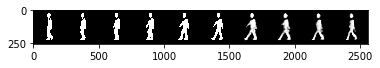

In [0]:
plt.imshow(y_pred_comb, cmap = 'gray')

In [0]:
y_true_comb = np.zeros((256,256*10))

for i in range(10):
  y_true_comb[:,256*i:256*(i+1)] = x2[i]

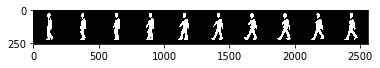

In [0]:
plt.imshow(y_true_comb,cmap='gray')

In [0]:
# y_comb = np.zeros((512,256*5))
# y_comb[:256,:] = y_true_comb
# y_comb[256:,:] = y_pred_comb
matplotlib.image.imsave('/content/gdrive/My Drive/gait_recon_results/5_pred.png', y_pred_comb , cmap = 'gray')
matplotlib.image.imsave('/content/gdrive/My Drive/gait_recon_results/5_true.png', y_true_comb , cmap = 'gray')

In [0]:
y_combined = np.zeros((512,256))
y_combined[:256,:] = y
y_combined[256:,:] = y_pred

In [0]:
matplotlib.image.imsave('/content/gdrive/My Drive/gait_recon_results/res_2.png', y , cmap = 'gray')

In [0]:
dir = '/content/gdrive/My Drive/gait_recon_results'
#l = len(os.listdir(dir))
a = os.listdir(dir)
a = a[-4:]
l  = len(a)
import numpy as np
y = np.zeros((512*l,256*5))

for i,p in enumerate(a):
    path = os.path.join(dir,p)
    img = cv2.imread(path)
    img = cv2.cvtColor(img , cv2.COLOR_BGR2GRAY)
    y[512*(i):512*(i+1),:] = img
    # try:
    #     y[256*(i):256*(i+1),:] = img
    # except:
    #     print("error")

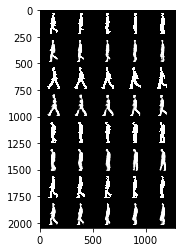

In [0]:
plt.imshow(y,cmap='gray')

In [0]:
len_nm05 = [ len(i) for i in nm05.values()]
max_len_nm05 =  max(len_nm05)
min_len_nm05 =  min(len_nm05)
print(max_len_nm05, min_len_nm05)
len_nm06 = [ len(i) for i in nm06.values()]
max_len_nm06 = max(len_nm06)
min_len_nm06 =  min(len_nm06)
print(max_len_nm06, min_len_nm06)



29 22
31 22


In [0]:
round(0.05*31) ,round(0.10*31), round(0.15*31), round(0.20*31), round(0.25*31), round(0.30*31), round(0.35*31), round(0.40*31), round(0.45*31), round(0.50*31)

(2, 3, 5, 6, 8, 9, 11, 12, 14, 16)

In [0]:
x = sub_images_test[0]
x = np.array(x)
x.shape

(56, 256, 256)

In [0]:
x_test = x[:13]
x_test = np.expand_dims(x_test , axis = 3)
x_test.shape

(13, 256, 256, 1)

In [0]:
x_test = np.vstack((x_test,np.expand_dims(x[18:23] , axis = 3)))
x_test.shape

(23, 256, 256, 1)

In [0]:
for i in range(5):
  pred = predictor.predict(np.expand_dims(x_test , axis = 0))[0]
  plt.figure()
  plt.imshow(np.squeeze(pred), cmap = 'gray')
  #print(pred.shape)
  x_test = np.vstack((x_test,pred))
  #x_test = np.vstack((x_test, np.expand_dims(x[9:14], axis = 3)))

In [0]:
res_nm05 = {}
for k in nm05.keys():
  x = nm05[k]
  x = np.array(x)
  l = len(x)
  p = round(0.15 * l)
  x_test = x[:10]
  x_test = np.expand_dims(x_test,axis=3)

  for i in range(p):
    pred = predictor.predict(np.expand_dims(x_test , axis = 0))[0]
    
    x_test = np.vstack((x_test,pred))

  try:
    x_test = np.vstack((x_test,np.expand_dims(x[10+p:],axis=3)))
  except:
    continue
  
 

  res_nm05[k] = x_test
  print(k)


res_nm06 = {}
for k in nm06.keys():
  x = nm06[k]
  x = np.array(x)
  l = len(x)
  p = round(0.15 * l)
  x_test = x[:10]
  x_test = np.expand_dims(x_test,axis=3)

  for i in range(p):
    pred = predictor.predict(np.expand_dims(x_test , axis = 0))[0]
    
    x_test = np.vstack((x_test,pred))

  try:
    x_test = np.vstack((x_test,np.expand_dims(x[10+p:],axis=3)))
  except:
    continue
  
 

  res_nm06[k] = x_test
  print(k)

  


  









  # for i in range(10,len(sub_images_test[k]),10):
  #   if i+4<=len(sub_images_test[k]):

  #     if i != 13:
  #       #print(type(x))
  #       x_test = np.vstack((x_test,np.expand_dims(x[j:i+1],axis=3)))
    
  #     for j in range(i,i+4):
  #       #pred = predictor.predict(np.expand_dims(x_test , axis = 0))[0]
  #       x_1 = np.random.randint(10,130)
  #       y_1 = np.random.randint(50,160)

  #       pred = a[j][:x_1][:y_1]
  #       pred = cv2.resize(pred , (256,256))
  #       mu, sigma = 0, 0.1
  #       s = np.random.normal(mu, sigma, (256,256))
  #       pred = pred + s
  #       #print(pred.shape)
  #       #print(x_test.shape)
  #       pred = np.expand_dims(np.expand_dims(pred,axis=3),axis=0)

  #       #pred = np.zeros((1,256,256,1))
  #       x_test = np.vstack((x_test,pred))
  # print(k)
  # #print(x_test.shape)
  # x_test = np.vstack((x_test,np.expand_dims(x[i:],axis=3)))
  #print(x_test.shape)
  
  



001
002
003
004
006
007
008
009
010
011
012
013
014
015
016
017
018
019
020
021
022
023
024
025
026
027
029
030
031
032
033
035
036
037
038
039
040
041
042
043
044
045
047
049
050
051
052
054
055
056
057
058
059
060
061
062
063
066
069
070
071
072
073
075
078
079
080
082
083
084
085
086
087
088
089
090
091
092
093
094
095
096
097
099
100
101
103
104
105
106
107
108
110
111
112
113
114
115
117
118
119
120
121
122
123
124
001
002
003
004
006
007
008
009
010
011
012
013
014
015
016
017
018
019
020
021
022
023
024
025
026
027
029
030
031
032
033
035
036
037
038
039
040
041
042
043
044
045
047
049
050
051
052
054
055
056
057
058
059
060
061
062
063
066
069
070
071
072
073
075
078
079
080
082
083
084
085
086
087
088
089
090
091
092
093
094
095
096
097
099
100
101
103
104
105
106
107
108
110
111
112
113
114
115
117
118
119
120
121
122
123
124


In [0]:
import scipy.io
scipy.io.savemat('/content/gdrive/My Drive/occ_results_nm05_05_1per.mat',occ_results_nm05)
scipy.io.savemat('/content/gdrive/My Drive/occ_results_nm06_05_1per.mat',occ_results_nm06)

In [0]:
gei = {}
for i in results.keys():
  gei[i] = np.mean(results[i] , axis = 0)


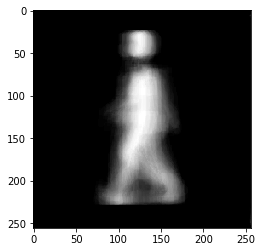

In [0]:
plt.imshow(np.squeeze(gei['002']) , cmap = 'gray')

In [0]:
a = scipy.io.loadmat('/content/gdrive/My Drive/results.mat')

/usr/local/lib/python3.6/dist-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


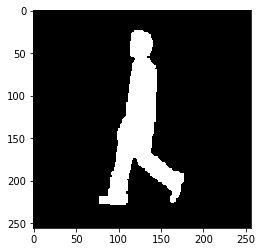

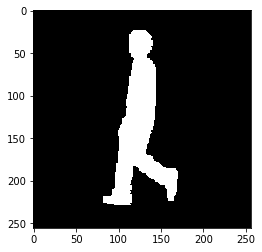

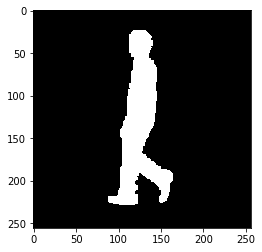

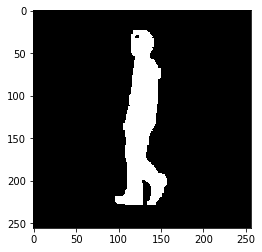

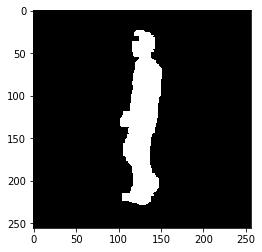

...

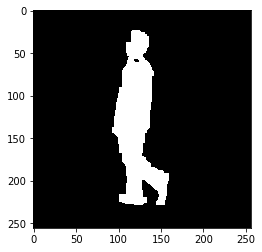

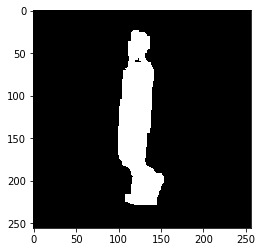

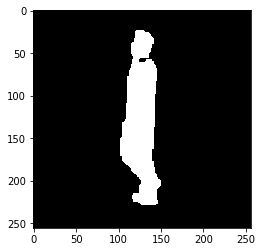

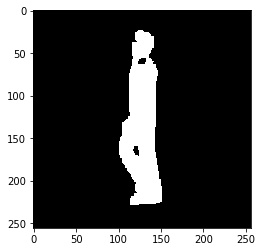

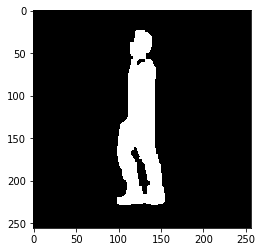

In [0]:
for i in range(len(occ_results_nm06['010'])):
  plt.figure()
  plt.imshow(np.squeeze(occ_results_nm06['010'][i]) , cmap = 'gray')


In [0]:
gei = np.mean(results[0],axis=0)
gei.shape

(256, 256, 1)

53
56


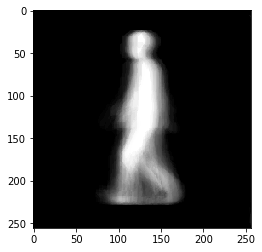

In [0]:
plt.imshow(np.squeeze(gei),cmap = 'gray')
print(len(results[0]))
print(len(sub_images_test[0]))

In [0]:
b = np.mean(a , axis = 0)
c = np.sum(a , axis = 0) / len(a)

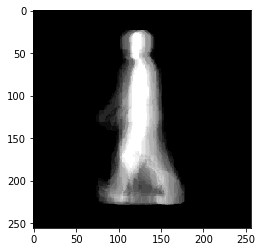

In [0]:
plt.imshow(b , cmap = 'gray')

In [0]:
temp_nm05=sub_images_test
for i in temp_nm05.keys():
  temp_nm05[i]=np.asarray(temp_nm05[i])

In [0]:
occ_nm05=np.copy(temp_nm05)
blank=np.zeros((256,256))
for k in temp_nm05.keys():
  for i in range(10,int(len(temp_nm05[k])),15):
    if i+5<= len(temp_nm05[k]):
      for j in range(i,i+5):
        occ_nm05[k][j]=blank

IndexError: ignored

In [0]:
occ_nm05['001'][1]

In [0]:
occ_nm05=np.copy(temp_nm05)

In [0]:
for k in range(len(temp_nm05)):
  for i in range(10,int(len(temp_nm05[k])),15):
    if i+5<= len(temp_nm05[k]):
      for j in range(i,i+5):
        #print(i,i+5)
        #if i == 10:
        occ_nm05[k][j]=np.squeeze(predictor.predict(np.expand_dims(np.expand_dims(occ_nm05[k][:j],axis=0),axis=4)))[0]
          #print(i,i+5)
        #else:
          #occ_nm05[k][j]=np.squeeze(predictor.predict(np.expand_dims(np.expand_dims(occ_nm05[k][:j],axis=0),axis=4)))[0]

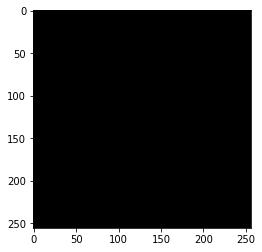

In [0]:
plt.imshow(occ_nm05[0][11],cmap='gray')

In [0]:
occ_nm05[0][:10].shape

(10, 256, 256)

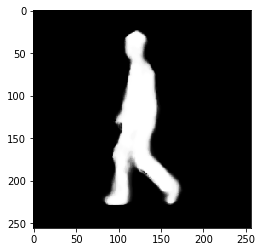

In [0]:
plt.imshow(np.squeeze(predictor.predict(np.expand_dims(np.expand_dims(temp_nm05[0][:13],axis=0),axis=4)))[0] , cmap = 'gray')

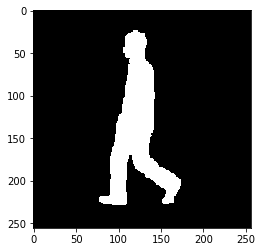

In [0]:
plt.imshow(temp_nm05[0][13] ,  cmap = 'gray')

In [0]:
import numpy as np 

a = np.ones((10,256,256))


In [0]:
a[2] = np.zeros((256,256))

In [0]:
a[1]

array([[1., 1., 1., ..., 1., 1., 1.],
       [1., 1., 1., ..., 1., 1., 1.],
       [1., 1., 1., ..., 1., 1., 1.],
       ...,
       [1., 1., 1., ..., 1., 1., 1.],
       [1., 1., 1., ..., 1., 1., 1.],
       [1., 1., 1., ..., 1., 1., 1.]])

In [0]:
import scipy.io
res_nm05 = scipy.io.loadmat('/content/gdrive/My Drive/occ_results_nm05_05_1per.mat')
res_nm06 = scipy.io.loadmat('/content/gdrive/My Drive/occ_results_nm06_05_1per.mat')
res = [res_nm05,res_nm06]

In [0]:
gei_nm05 = {}
gei_nm06 = {}
for i in res_nm05.keys():
  if len(i) == 3:
    gei = np.mean(res_nm05[i] , axis = 0)

    gei_nm05[int(i)] = gei

for i in res_nm06.keys():
  if len(i) == 3:
    gei = np.mean(res_nm06[i] , axis = 0)

    gei_nm06[int(i)] = gei

  

106

In [0]:
import matplotlib
c = 0
#print(len(res))
for k in res:
  c+=1
  print(c)
  for i in k.keys():
    try:
      if len(i)==3:
        
        if os.path.exists('/content/gdrive/My Drive/occ_res_gei_20per') == 0:
          os.mkdir('/content/gdrive/My Drive/occ_res_gei_20per')

        if os.path.exists('/content/gdrive/My Drive/occ_res_gei_20per/{}'.format(i)) == 0:
          os.mkdir('/content/gdrive/My Drive/occ_res_gei_20per/{}'.format(i))

       
        matplotlib.image.imsave('/content/gdrive/My Drive/occ_res_gei_20per/{}/{}.png'.format(i,c), np.squeeze(np.mean(k[i],axis=0)), cmap = 'gray')
        print('saved')
        #print(c)
    except:
      continue
  #c+=1

1
saved
saved
saved
saved
saved
saved
saved
saved
saved
saved
saved
saved
saved
saved
saved
saved
saved
saved
saved
saved
saved
saved
saved
saved
saved
saved
saved
saved
saved
saved
saved
saved
saved
saved
saved
saved
saved
saved
saved
saved
saved
saved
saved
saved
saved
saved
saved
saved
saved
saved
saved
saved
saved
saved
saved
saved
saved
saved
saved
saved
saved
saved
saved
saved
saved
saved
saved
saved
saved
saved
saved
saved
saved
saved
saved
saved
saved
saved
saved
saved
saved
saved
saved
saved
saved
saved
saved
saved
saved
saved
saved
saved
saved
saved
saved
saved
saved
saved
saved
saved
saved
saved
saved
saved
saved
saved
2
saved
saved
saved
saved
saved
saved
saved
saved
saved
saved
saved
saved
saved
saved
saved
saved
saved
saved
saved
saved
saved
saved
saved
saved
saved
saved
saved
saved
saved
saved
saved
saved
saved
saved
saved
saved
saved
saved
saved
saved
saved
saved
saved
saved
saved
saved
saved
saved
saved
saved
saved
saved
saved
saved
saved
saved
saved
saved
saved
saved


In [0]:
len(res_nm05['001'])

25

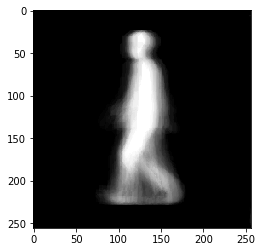

In [0]:
gei = np.mean(res_nm05['001'],axis=0)
plt.imshow(np.squeeze(gei),cmap='gray')

In [0]:
def load_data(data_dir):
  import os
  sub_ids = os.listdir(data_dir)
  #print(len(sub_ids))
  sub_paths = [os.path.join(data_dir,id) for id in sub_ids]
  
  X = []
  Y = []
  import cv2
  import numpy as np
  for path in sub_paths:
    img_path = [ os.path.join(path,img) for img in os.listdir(path)]
    for p in img_path:
      id = int(p.split('/')[-2])
      #print(id)
      _ = cv2.imread(p)
      _ = cv2.cvtColor(_ , cv2.COLOR_BGR2GRAY)
      _ = cv2.resize(_ , (128,128))
      _ = np.array(_).astype('float32') / 255.
      X.append(_)
      Y.append(id)

  import random
  combined = list(zip(X, Y))
  random.shuffle(combined)

  X[:], Y[:] = zip(*combined)

  return np.array(X), np.array(Y)

def load_data_from_dict(dict1 , dict2):
  X = []
  Y = []
  for i in dict1.keys():
    
    X.append(cv2.resize(dict1[i],(128,128)))
    Y.append(i)

  for i in dict2.keys():
    X.append(cv2.resize(dict1[i],(128,128)))
    Y.append(i)

  import random
  combined = list(zip(X, Y))
  random.shuffle(combined)

  X[:], Y[:] = zip(*combined)

  return np.array(X), np.array(Y)

  

In [0]:
train_dir = '/content/gdrive/My Drive/Casia_BGEI_1gait'

In [0]:
X,Y = load_data(train_dir)

In [0]:
X = X.reshape((-1 , 128*128))

In [0]:
from sklearn.decomposition import PCA

pca = PCA(0.98)
X_trans = pca.fit_transform(X)

In [0]:
X_trans.shape

(212, 118)

In [0]:
len(Y)

212

In [0]:
from sklearn.model_selection import train_test_split

X_train, X_val , y_train, y_val = train_test_split(X_trans, Y, test_size = 0.2)

In [0]:
from sklearn.ensemble import RandomForestClassifier,AdaBoostClassifier
from sklearn.neighbors import KNeighborsClassifier

alg = RandomForestClassifier(n_estimators=200,criterion='entropy')
#alg = KNeighborsClassifier(n_neighbors=2)

In [0]:
import pickle 
pickle.dump(alg , open('/content/gdrive/My Drive/random_forest.pkl','wb'))

In [0]:
import pickle
alg = pickle.load(open('/content/gdrive/My Drive/random_forest.pkl','rb'))

In [0]:
alg.fit(X_train, y_train)

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='entropy',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=200,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

In [0]:
y_pred_train = alg.predict(X_train)
y_pred_val   = alg.predict(X_val)

In [0]:
from sklearn import metrics
# print("Train Accuracy:",metrics.accuracy_score(y_train, y_pred_train))
# print("Val Accuracy:",metrics.accuracy_score(y_val, y_pred_val))

In [0]:
alg.predict_proba(X_train).shape

(169, 103)

In [0]:
test_dir = '/content/gdrive/My Drive/res_gei'

In [0]:
X_test, y_test = load_data(test_dir)

In [0]:
X_test = np.reshape(X_test , (-1 , 128*128))
X_test = pca.transform(X_test)

In [0]:
X_test.shape

(212, 161)

In [0]:
y_pred_test = alg.predict(X_test)
print("Test Accuracy:",metrics.accuracy_score(y_test, y_pred_test))

Test Accuracy: 0.9245283018867925


In [0]:
occ_test_dir = '/content/gdrive/My Drive/occ_res_gei_5per'

In [0]:
X_test_occ, y_test_occ = load_data_from_dict(gei_nm05,gei_nm06)

In [0]:
X_test_occ = np.reshape(X_test_occ , (-1 , 128*128))
X_test_occ = pca.transform(X_test_occ)

In [0]:
X_test_occ.shape

(212, 118)

In [0]:
y_pred_test_occ = alg.predict(X_test_occ)
print("OCC Test Accuracy:",metrics.accuracy_score(y_test_occ, y_pred_test_occ))

OCC Test Accuracy: 0.9056603773584906


a = images_test[0][1]

In [0]:
prob = alg.predict_proba(X_test_occ)

12

In [0]:

b = cv2.resize(b , (256,256))

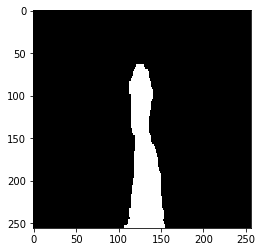

In [0]:
plt.imshow(b , cmap = 'gray')

In [0]:
import scipy.io
occ_mat = scipy.io.loadmat('/content/gdrive/My Drive/10_frames_occ_created_06/occ_created_randomly_det_using_vgg_06_50%.mat')

In [0]:
occ_mat['index_of_occluded_frames'][0][0][0]

# for i in range(len(occ_mat['index_of_occluded_frames'][0])):
#   print(len(occ_mat['index_of_occluded_frames'][0][i][0]))

array([ 6, 10, 11, 12, 13, 15])

In [0]:
occ_mat['frames_array'][0][0].shape

(25, 224, 224, 3)

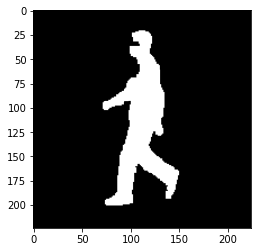

In [0]:
import matplotlib.pyplot as plt

plt.imshow(occ_mat['frames_array'][0][30][13] , cmap = 'gray')
#plt.imshow(trans_mat[30][20] , cmap = 'gray')

In [0]:
len(occ_mat['frames_array'][0])

105

In [0]:
import cv2
trans_mat = []
for i in range(len(occ_mat['frames_array'][0])):
  sub = occ_mat['frames_array'][0][i]
  _ = []
  for j in range(len(sub)):
    a = cv2.cvtColor(occ_mat['frames_array'][0][i][j] , cv2.COLOR_BGR2GRAY)
    a = cv2.resize(a , (256,256))
    ret , a  = cv2.threshold(a  , 127 , 1 , cv2.THRESH_BINARY) 
    #a  = np.expand_dims(a , axis = 2)
    _.append(a)
  trans_mat.append(_)

In [0]:
occ_mat.keys()

dict_keys(['__header__', '__version__', '__globals__', 'frames_array', 'index_of_occluded_frames', 'labels'])

In [0]:
occ_mat['labels'][0]

'009'

In [0]:
res_mat = {}
for i in range(len(occ_mat['frames_array'][0])):
  x = trans_mat[i]
  
  if len(occ_mat['index_of_occluded_frames'][0][i][0]) > 1:

    x_test = x[:occ_mat['index_of_occluded_frames'][0][i][0][0]]
    x_test = np.expand_dims(x_test,axis=3)


    for j in range(len(occ_mat['index_of_occluded_frames'][0][i][0])-1):

      pred = predictor.predict(np.expand_dims(x_test , axis = 0))[0]
      x_test = np.vstack((x_test,pred))
      #print(x_test.shape)
      #print((np.expand_dims(np.array(x[occ_mat['index_of_occluded_frames'][0][i][0][0]+1:occ_mat['index_of_occluded_frames'][0][i][0][1]]),axis=3)).shape)
      try:
        x_test = np.vstack((x_test,np.expand_dims(np.array(x[occ_mat['index_of_occluded_frames'][0][i][0][j]+1:occ_mat['index_of_occluded_frames'][0][i][0][j+1]]),axis=3)))

      except:
        #print('consecutive')
        pass
      #print(j)

    pred = predictor.predict(np.expand_dims(x_test , axis = 0))[0]
    x_test = np.vstack((x_test,pred))
    try:
      x_test = np.vstack((x_test,np.expand_dims(x[occ_mat['index_of_occluded_frames'][0][i][0][len(occ_mat['index_of_occluded_frames'][0][i][0])-1]+1:],axis=3)))
    except:
      pass
    



    res_mat[occ_mat['labels'][i]] = x_test
    print(i)
    
  else:

    x_test = x[:occ_mat['index_of_occluded_frames'][0][i][0][0]]
    x_test = np.expand_dims(x_test,axis=3)


    pred = predictor.predict(np.expand_dims(x_test , axis = 0))[0]
    x_test = np.vstack((x_test,pred))
    x_test = np.vstack((x_test,np.expand_dims(x[occ_mat['index_of_occluded_frames'][0][i][0][0]+1:],axis=3)))

    res_mat[occ_mat['labels'][i]] = x_test
    print(i) 



  # res_mat[occ_mat['labels'][i]] = x_test
  # print(i) 
  


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:18: DeprecationWarning: Both axis > a.ndim and axis < -a.ndim - 1 are deprecated and will raise an AxisError in the future.


0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104


In [0]:
len(occ_mat['index_of_occluded_frames'][1][0])

NameError: ignored

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


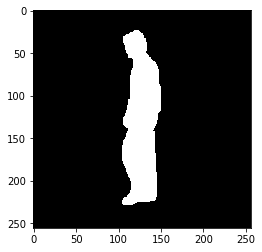

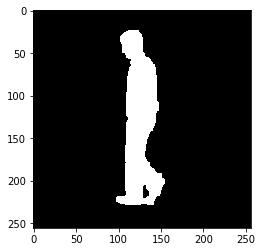

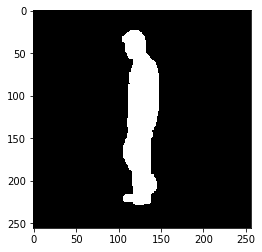

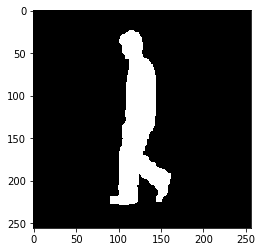

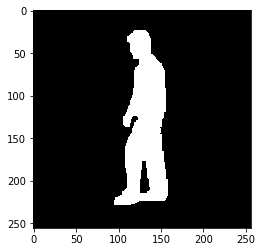

...

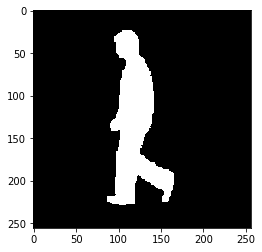

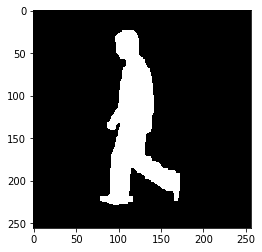

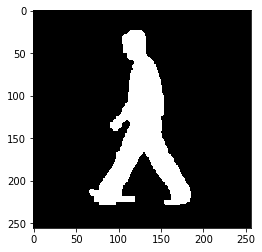

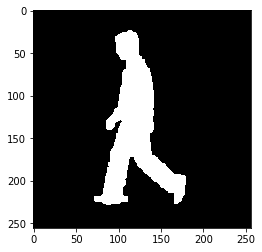

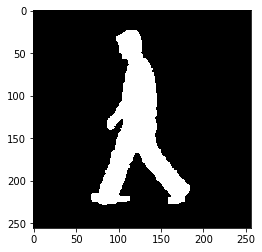

In [0]:
for i in range(len(res_mat['009'])):
  plt.figure()
  plt.imshow(np.squeeze(res_mat['009'][i]) , cmap = 'gray')

In [0]:


scipy.io.savemat('/content/gdrive/My Drive/10_frames_occ_created_06/res_mat_05_50%.mat',res_mat)

In [0]:
a = trans_mat[5]
a = a[occ_mat['index_of_occluded_frames'][0][5][0][0]+1:occ_mat['index_of_occluded_frames'][0][5][0][1]]
print(len(a))

0


In [0]:
a = np.array(a)
a.shape

(0,)

In [0]:
len(a)

29

In [0]:
occ_mat['index_of_occluded_frames'][0][1][0]

array([ 0,  1,  2,  8,  9, 11, 13, 15, 20])

In [0]:
data_path = '/content/gdrive/My Drive/Fliped_Shifted_alngd_with_more_folders'
sub_ids = os.listdir(data_path)
ids = [  id.split('_')[-2][-3:] for id in sub_ids]

In [0]:
d1_1 = {}
d1_2 = {}
d2_1 = {}
d2_2 = {}
d3_1 = {}
d3_2 = {}
d4_1 = {}
d4_2 = {}



for i in range(len(ids)):
  sub = os.path.join(data_path,sub_ids[i])
  for sub_f in os.listdir(sub):
    img_path = os.listdir(os.path.join(sub,sub_f))
    _ = []
    for frame in img_path:
      
      frame_path = os.path.join(os.path.join(sub,sub_f),frame)
      #print(frame_path)
      frame = cv2.imread(frame_path)
      #frame = cv2.cvtColor(frame,cv2.COLOR_BGR2GRAY)
      frame = cv2.resize(frame, (224,224))
      frame = np.array(frame).astype('float32') / 255.
      #ret , frame = cv2.threshold(frame,127,1,cv2.THRESH_BINARY)
      _.append(frame)
    if sub_f == 'd1_1':
      d1_1[ids[i]] = _
    if sub_f == 'd1_2':
      d1_2[ids[i]] = _
    if sub_f == 'd2_1':
      d2_1[ids[i]] = _
    if sub_f == 'd2_2':
      d2_2[ids[i]] = _
    if sub_f == 'd3_1':
      d3_1[ids[i]] = _
    if sub_f == 'd3_2':
      d3_2[ids[i]] = _
    if sub_f == 'd4_1':
      d4_1[ids[i]] = _
    if sub_f == 'd4_2':
      d4_2[ids[i]] = _

  
  print(i)


0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34


In [0]:
import scipy.io 
d1_1 = scipy.io.loadmat('/content/gdrive/My Drive/tum_mat/d1_1.mat')
d1_2 = scipy.io.loadmat('/content/gdrive/My Drive/tum_mat/d1_2.mat')
d2_1 = scipy.io.loadmat('/content/gdrive/My Drive/tum_mat/d2_1.mat')
d2_2 = scipy.io.loadmat('/content/gdrive/My Drive/tum_mat/d2_2.mat')
d3_1 = scipy.io.loadmat('/content/gdrive/My Drive/tum_mat/d3_1.mat')
d3_2 = scipy.io.loadmat('/content/gdrive/My Drive/tum_mat/d3_2.mat')
d4_1 = scipy.io.loadmat('/content/gdrive/My Drive/tum_mat/d4_1.mat')
d4_2 = scipy.io.loadmat('/content/gdrive/My Drive/tum_mat/d4_2.mat')
# scipy.io.savemat('/content/gdrive/My Drive/tum_mat/d4_2.mat',d4_2)
# scipy.io.savemat('/content/gdrive/My Drive/tum_mat/d2_1.mat',d2_1)
# scipy.io.savemat('/content/gdrive/My Drive/tum_mat/d2_2.mat',d2_2)
# scipy.io.savemat('/content/gdrive/My Drive/tum_mat/d3_1.mat',d3_1)
# scipy.io.savemat('/content/gdrive/My Drive/tum_mat/d3_2.mat',d3_2)


In [0]:
d4_1.keys()

dict_keys(['__header__', '__version__', '__globals__', '002', '007', '001', '003', '006', '004', '008', '010', '009', '005', '011', '020', '015', '019', '017', '013', '014', '016', '012', '018', '024', '025', '021', '028', '026', '027', '030', '022', '023', '029', '031', '034', '035', '033', '032'])

In [0]:
from keras.models import load_model
occ_det = load_model('/content/gdrive/My Drive/occlusion_detection.h5')


In [0]:
def preprocess(img):
  img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
  img = cv2.resize(img , (256,256))
  #print(img.min(), img.max())
  ret,img=cv2.threshold(img, 0.5 , 1 , cv2.THRESH_BINARY)
  #img = np.expand_dims(np.expand_dims(img,axis=0),axis=3)
  return img

In [0]:
from time import time

In [0]:
res_d1_1 = {}
c = 0
response_time = 0
for key in d1_1.keys():
  try:
    
    x = np.array(d1_1[key])
    x_test = np.array([preprocess(x[k]) for k in range(10)])
    x_test = np.expand_dims(x_test,axis=3)
    for i in range(10,len(x)):
      start = time()
      if occ_det.predict_classes(np.expand_dims(x[i],axis=0))[0][0] == 0:
        pred = predictor.predict(np.expand_dims(x_test , axis = 0))[0]
        response_time += (time() - start)
        c+=1
        #plt.figure()
        #plt.imshow(np.squeeze(pred),cmap='gray')
        x_test = np.vstack((x_test,pred))
      else:
        _ = preprocess(x[i])
        _ = np.expand_dims(np.expand_dims(_,axis=0),axis=3)
        #print(x_test.shape)
        x_test = np.vstack((x_test,_))

    res_d1_1[key] = x_test
    print(key)

  except:
    continue

      

    

002
007
001
003
006
004
008
010
009
005
011
020
015
019
017
013
014
016
012
018
024
025
021
028
026
027
030
022
023
029
031
034
035
033
032


In [0]:

scipy.io.savemat('/content/gdrive/My Drive/tum_mat/res_d4_2.mat',res_d4_2)

In [0]:
total_response_time = response_time / c
print(total_response_time)

0.44064174663452876


In [0]:
import matplotlib.pyplot as plt
acc = [93.39 , 96.19, 96.19, 96.19, 97.14]



In [0]:
geis_d4_1 = {}
for key in d4_1.keys():
  try:
    seq = d4_1[key]
    gei = np.sum(seq,axis=0)
    gei = gei / len(seq)
    gei = cv2.resize(gei , (256,256))
    #print(gei.min(),gei.max())
    #gei = np.array(gei).astype('float32') / 255.
    geis_d4_1[key] = gei
  except:
    continue

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:6: RuntimeWarning: invalid value encountered in double_scalars
  


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This is separate from the ipykernel package so we can avoid doing imports until


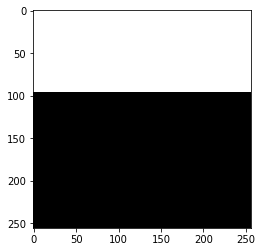

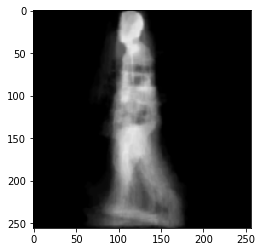

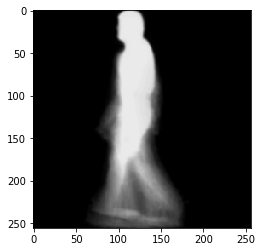

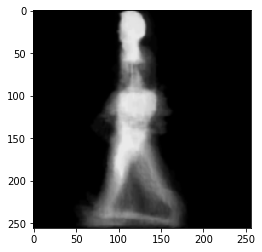

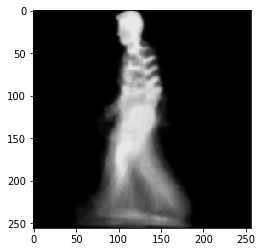

...

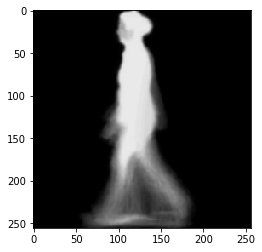

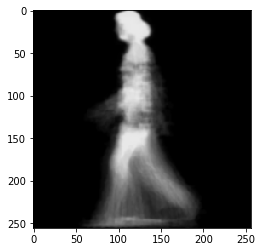

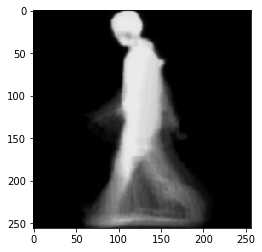

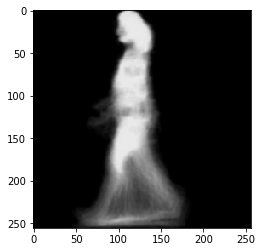

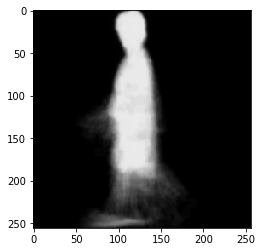

In [0]:
for key in geis_d4_2.keys():
  try:
    plt.figure()
    plt.imshow(geis_d4_2[key],cmap = 'gray')
  except:
    continue


In [0]:
geis_d1_1['001'].shape

(224, 224, 3)

In [0]:
len(geis_d1_1.keys())

36

In [0]:
gt_gei = '/content/gdrive/My Drive/normal_gei'
sub = os.listdir(gt_gei)
sub = sub[:-1]
print(sub)
sub_path = [ os.path.join(gt_gei,i) for i in sub]

['001', '002', '003', '004', '005', '006', '007', '008', '009', '010', '011', '012', '013', '014', '015', '016', '017', '018', '019', '020', '021', '022', '023', '024', '025', '026', '027', '028', '029', '030', '031', '032', '033', '034', '035']


In [0]:
gt_y = {}
for path in sub_path:
  img_path = os.path.join(path,os.listdir(path)[0])
  img = cv2.imread(img_path)
  img = np.array(img).astype('float32') / 255. 
  gt_y[path.split('/')[-1]] = img
  

In [0]:
X = []
Y = []

In [0]:

def create_dataset(x_gei,y_gei):
  for key in x_gei.keys():
    if key != '__globals__':
      X.append(x_gei[key])
      Y.append(y_gei[key])

In [0]:
create_dataset(geis_d3_2,gt_y)

In [0]:
print(len(X))
print(len(Y))

210
210


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  after removing the cwd from sys.path.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


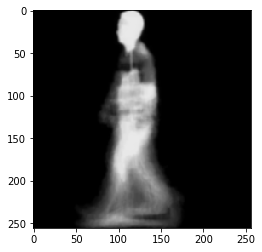

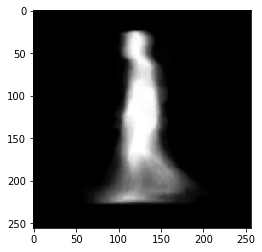

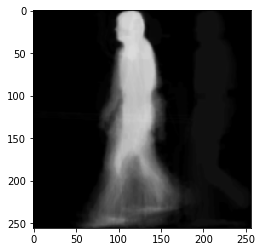

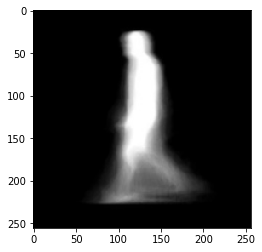

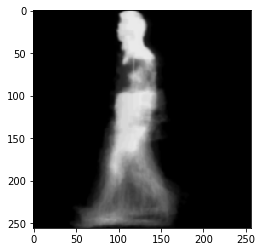

...

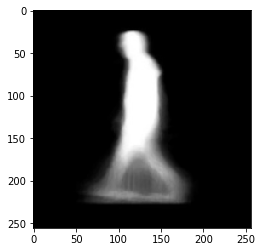

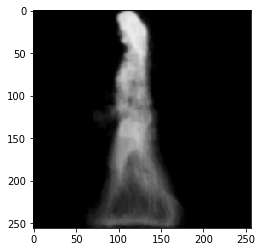

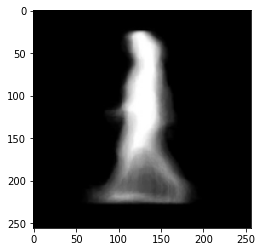

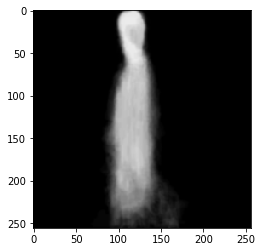

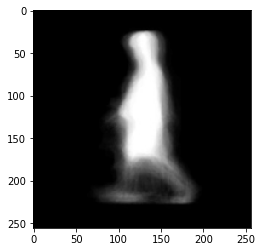

In [0]:
for i in range(len(X)):
  X[i] = cv2.resize(X[i],(256,256))
  Y[i] = cv2.resize(Y[i],(256,256))
  plt.figure()
  plt.imshow(X[i])
  plt.figure()
  plt.imshow(Y[i])


In [0]:
print(geis_d1_1.keys())
print(gt_y.keys())

dict_keys(['__globals__', '002', '007', '001', '003', '006', '004', '008', '010', '009', '005', '011', '020', '015', '019', '017', '013', '014', '016', '012', '018', '024', '025', '021', '028', '026', '027', '030', '022', '023', '029', '031', '034', '035', '033', '032'])
dict_keys(['001', '002', '003', '004', '005', '006', '007', '008', '009', '010', '011', '012', '013', '014', '015', '016', '017', '018', '019', '020', '021', '022', '023', '024', '025', '026', '027', '028', '029', '030', '031', '032', '033', '034', '035'])


In [0]:
X = np.array(X)
Y = np.array(Y)

In [0]:
from keras.layers import Conv2D, Dense, UpSampling2D
from keras.layers.advanced_activations import LeakyReLU
from keras.layers import BatchNormalization , Concatenate, Dropout, Input
from keras.models import Model
from keras.optimizers import Adam

In [0]:
def generator():
  
  def conv2d(layer_input,filters,f_size=4,bn=True):
    d = Conv2D(filters, kernel_size = f_size, strides = 2 , padding = 'same')(layer_input)
    d = LeakyReLU(alpha = 0.2)(d)
    if bn:
      d = BatchNormalization(momentum=0.8)(d)
      
    return d
  
  def deconv2d(layer_input, skip_input , filters , f_size=4 , dropout_rate = 0):
    
    d = UpSampling2D(size=2)(layer_input)
    d = Conv2D(filters, kernel_size=f_size, strides=1, padding='same', activation='relu')(d)
    if dropout_rate:
      d = Dropout(dropout_rate)(d)
      
    d = BatchNormalization(momentum=0.8)(d)
    d = Concatenate(axis=-1)([d,skip_input])
    
    return d
  
  
  d0 = Input(shape=(256,256,3))
  d1 = conv2d(d0, 64, bn=False)  # 128x128
  d2 = conv2d(d1, 64*2)          # 64x64
  d3 = conv2d(d2, 64*4)          # 32x32
  d4 = conv2d(d3, 64*8)          # 16x16
  d5 = conv2d(d4, 64*8)          # 8x8
  d6 = conv2d(d5, 64*8)          # 4x4
  d7 = conv2d(d6, 64*8)          # 2x2
  
  u1 = deconv2d(d7, d6 , 64*8)   # 4x4 
  u2 = deconv2d(u1, d5 , 64*8)   # 8x8
  u3 = deconv2d(u2, d4 , 64*8)   # 16x16
  u4 = deconv2d(u3, d3 , 64*4)   # 32x32
  u5 = deconv2d(u4, d2 , 64*2)   # 64x64
  u6 = deconv2d(u5, d1 , 64)     # 128x128
  
  u7 = UpSampling2D(size=2)(u6)
  out_img = Conv2D(filters = 3 , kernel_size = 4 , strides = 1 , padding = 'same', activation = 'sigmoid')(u7)
  
  return Model(inputs=d0, outputs=out_img)

In [0]:
gen = generator()

In [0]:
gen.compile(loss = 'mse' , optimizer='adam')
gen.fit(X,Y,epochs = 50 , batch_size=32)



Epoch 1/50
210/210 [==============================] - 16s 77ms/step - loss: 0.1266
Epoch 2/50
210/210 [==============================] - 4s 19ms/step - loss: 0.0445
Epoch 3/50
210/210 [==============================] - 4s 19ms/step - loss: 0.0268
Epoch 4/50
210/210 [==============================] - 4s 19ms/step - loss: 0.0159
Epoch 5/50
210/210 [==============================] - 4s 19ms/step - loss: 0.0111
Epoch 6/50
210/210 [==============================] - 4s 19ms/step - loss: 0.0083
Epoch 7/50
210/210 [==============================] - 4s 19ms/step - loss: 0.0074
Epoch 8/50
210/210 [==============================] - 4s 19ms/step - loss: 0.0073
Epoch 9/50
210/210 [==============================] - 4s 19ms/step - loss: 0.0062
Epoch 10/50
210/210 [==============================] - 4s 19ms/step - loss: 0.0060
Epoch 11/50
210/210 [==============================] - 4s 19ms/step - loss: 0.0049
Epoch 12/50
210/210 [==============================] - 4s 19ms/step - loss: 0.0044
Epoch 13/5

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:10: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  # Remove the CWD from sys.path while we load stuff.


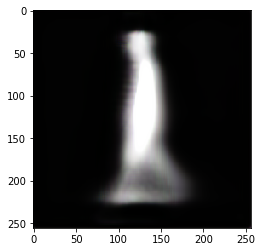

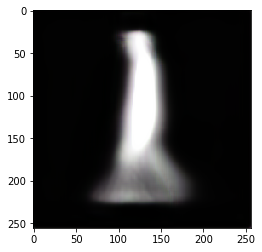

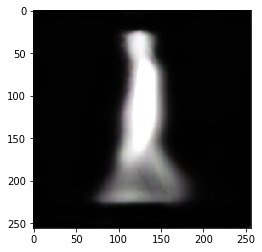

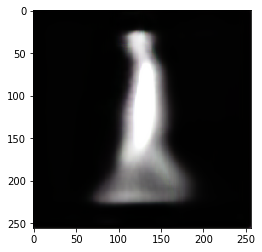

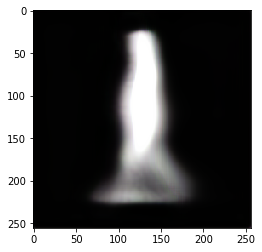

...

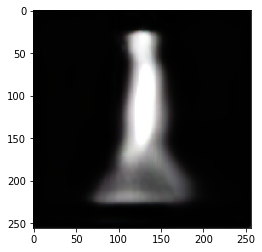

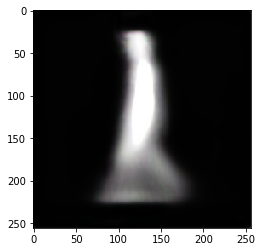

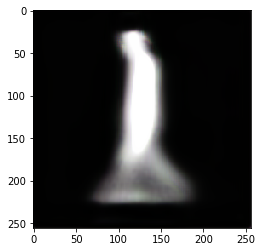

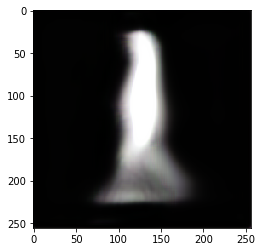

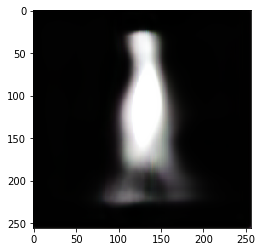

In [0]:
new_res_d4_2 = {}
c = 0
from time import time
res_time = 0
for key in geis_d4_2:
  if key != '__globals__':
    start = time()
    new_res_d4_2[key] = np.squeeze(gen.predict(np.expand_dims(geis_d4_2[key],axis=0)))
    res_time += (time() - start)
    plt.figure()
    plt.imshow(new_res_d4_1[key])
    c+=1

In [0]:
scipy.io.savemat('/content/gdrive/My Drive/new_res_d4_2.mat',new_res_d4_2)

In [0]:
response_time = res_time / c
print(response_time)

0.023101656777518135
